In [1]:
%matplotlib widget
import matplotlib
import matplotlib.pyplot as plt
import skimage.io as io
import cv2

from pathlib import Path
import numpy as np
from scipy.spatial.distance import cdist

from skimage.transform import warp, ProjectiveTransform
from skimage.measure import ransac

import torch
from hloc import extractors
from hloc.extract_features import confs, ImageDataset, dynamic_load


# Load images

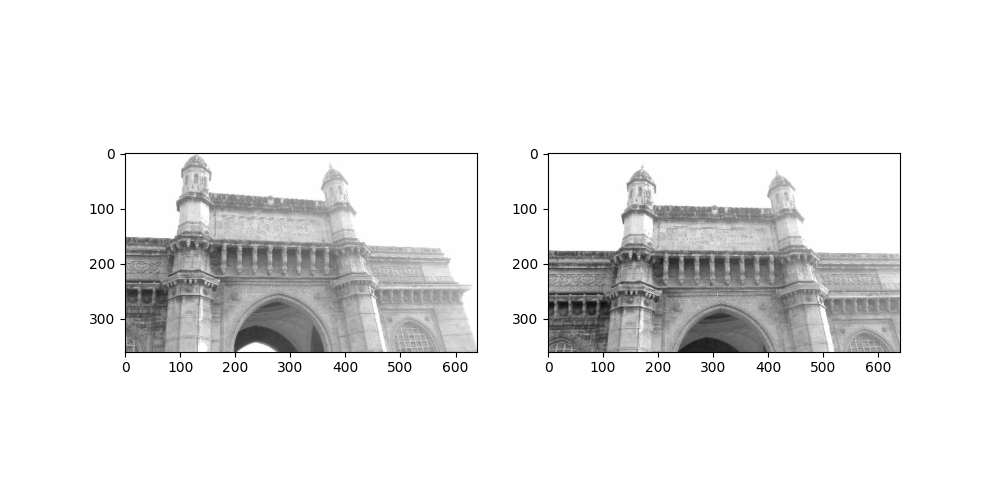

In [2]:
goi1, goi2 = io.imread("img/goi1.jpg"), io.imread("img/goi2.jpg")
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
plt.gray()

ax[0].imshow(goi1)
ax[1].imshow(goi2);

# SIFT (1999)

Adds Scale-invariance to kp detection
Provides a way to ``describe'' each keypoint, from stats around it.

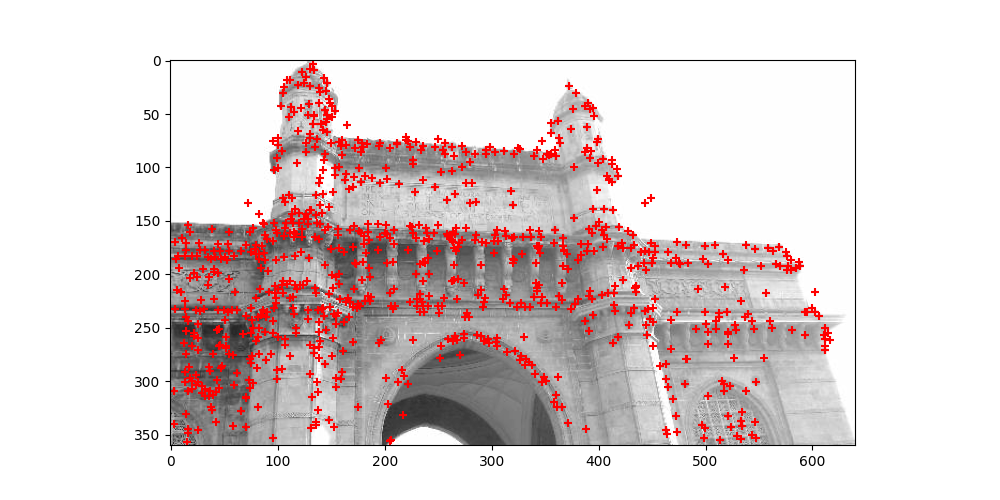

In [3]:
sift = cv2.SIFT_create()
kp1, descriptors_1 = sift.detectAndCompute(goi1, None)
kp1 = np.array([p.pt for p in kp1])

fig = plt.figure(figsize=(10, 5))
plt.imshow(goi1)
plt.scatter(kp1[:, 0], kp1[:, 1], marker="+", c="r");

In [4]:
descriptors_1.shape

(1051, 128)

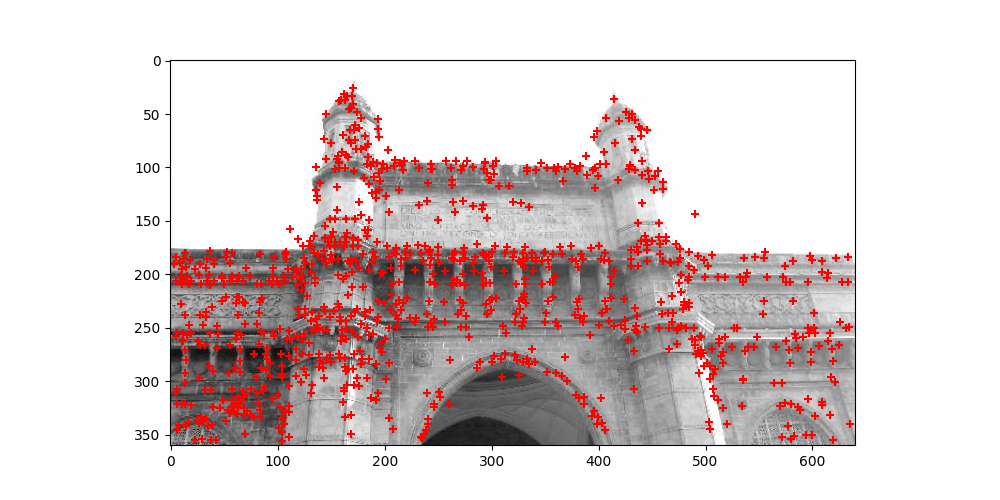

In [5]:
sift = cv2.SIFT_create()
kp2, descriptors_2 = sift.detectAndCompute(goi2, None)
kp2 = np.array([p.pt for p in kp2])

fig = plt.figure(figsize=(10, 5))
plt.imshow(goi2)
plt.scatter(kp2[:, 0], kp2[:, 1], marker="+", c="r");

In [6]:
descriptors_2.shape

(1134, 128)

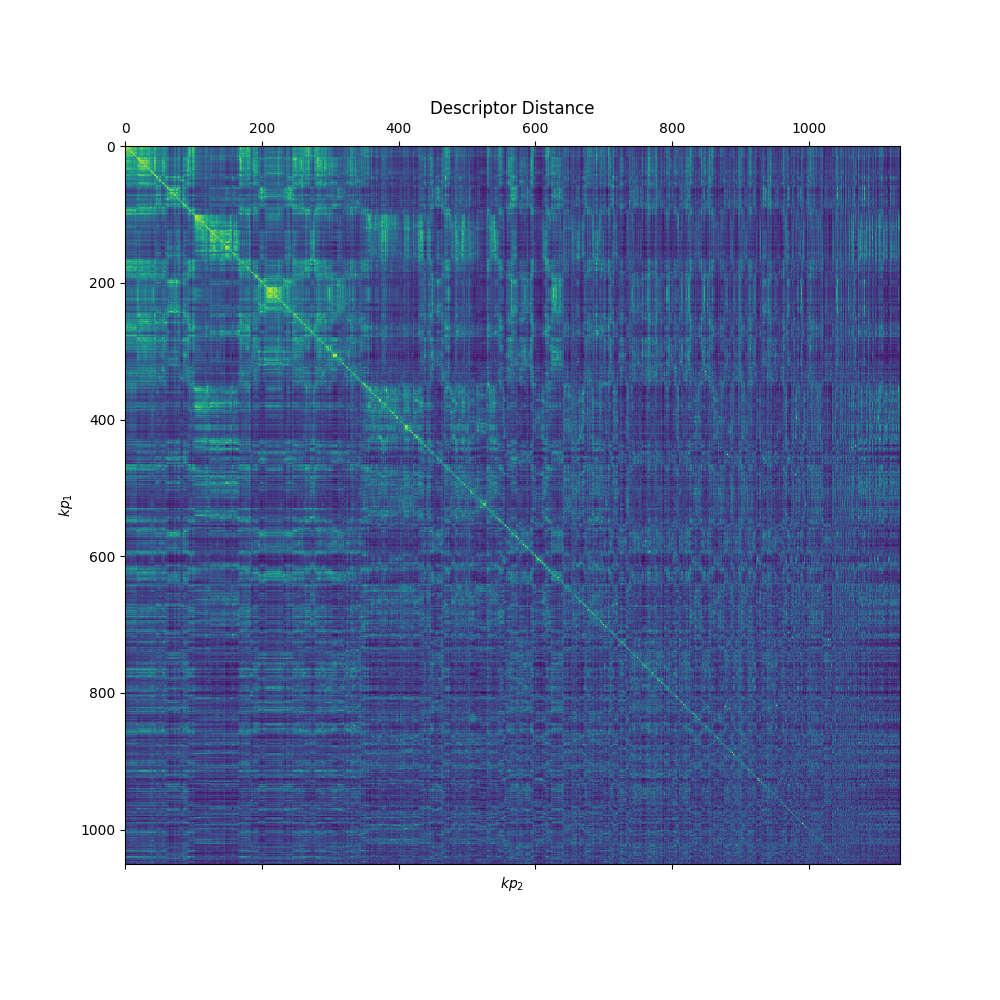

In [7]:
cross_distance = cdist(descriptors_1, descriptors_2)

def sort_matrix(d):
    for i in range(min(d.shape)):
        fixed = np.arange(i)
        d = d[:, np.r_[fixed, i + np.argsort(d[i, i:])]]
        d = d[np.r_[fixed, i + np.argsort(d[i:, i])], :]
    return d



fig = plt.figure(figsize=(10, 10))
plt.matshow(-sort_matrix(cross_distance), fignum=0, cmap="viridis");
plt.ylabel("$kp_1$")
plt.xlabel("$kp_2$");
plt.title("Descriptor Distance");

## Mutual Nearest-Neighbors matching

In [8]:
def nearest_neighbour(x1, x2):
    cross_distance = cdist(x1, x2)

    nn = []
    for i in range(x1.shape[0]):
        nn.append((i, np.argmin(cross_distance[i, :])))
    return nn

def transpose(pairs):
    return [(y, x) for x, y in pairs]

def mutual_nn(x1, x2):
    nn1 = nearest_neighbour(x1, x2) # compute forward matches
    nn2 = transpose(nearest_neighbour(x2, x1)) # compute backwards matches
    return list(set(nn1) & set(nn2))

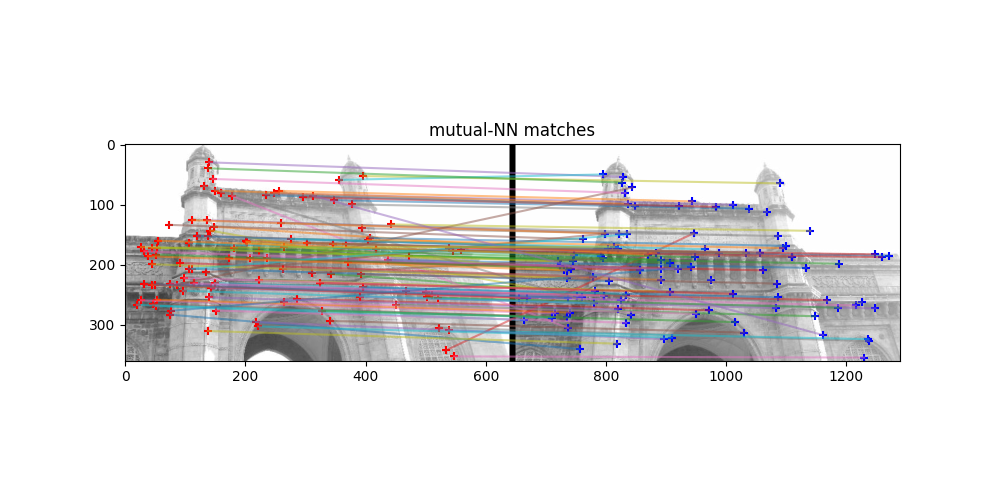

In [9]:
# plot matches
mnn_matches = mutual_nn(descriptors_1, descriptors_2)
pairs = mnn_matches[::5]
matched_1 = kp1[[i for i, _ in pairs]]
matched_2 = kp2[[i for _, i in pairs]]


fig, ax = plt.subplots(1, 1, figsize=(10,5))

#plot images
padding = 10
ax.imshow(np.c_[goi1, np.zeros((goi1.shape[0], padding)), goi2])
dx = goi1.shape[1] + padding

# plot matched kps    
ax.scatter(matched_1[:, 0], matched_1[:, 1], marker="+", c="r");
ax.scatter(dx + matched_2[:, 0], matched_2[:, 1], marker="+", c="b");
    
for (x, y), (w, z) in zip(matched_1, matched_2):
    ax.plot((x, dx + w), (y, z), alpha=0.5)

ax.set_title("mutual-NN matches");

## Mutual Nearest-Neighbors matching with Ratio test

In [10]:
def ratio_NN(x1, x2, ratio=0.8):
    cross_distance = cdist(x1, x2)
    nn = []
    for i in range(x1.shape[0]):
        dist = np.argsort(cross_distance[i, :])
        if cross_distance[i, dist[0]] < ratio*cross_distance[i, dist[1]]:
            nn.append((i, dist[0]))
    return nn

def mutual_rNN(x1, x2, ratio=0.8):
    nn1 = ratio_NN(x1, x2, ratio) # compute forward matches
    nn2 = transpose(ratio_NN(x2, x1, ratio)) # compute backwards matches
    return list(set(nn1) & set(nn2))

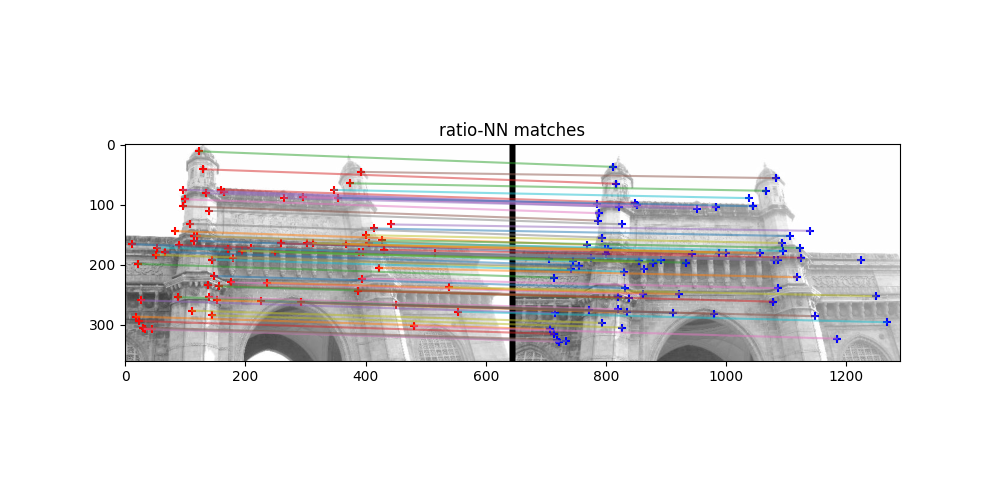

In [11]:
# plot matches
rnn_matches = ratio_NN(descriptors_1, descriptors_2, ratio=0.5)
pairs = rnn_matches[::3]
matched_1 = kp1[[i for i, _ in pairs]]
matched_2 = kp2[[i for _, i in pairs]]


fig, ax = plt.subplots(1, 1, figsize=(10,5))

#plot images
padding = 10
ax.imshow(np.c_[goi1, np.zeros((goi1.shape[0], padding)), goi2])
dx = goi1.shape[1] + padding

# plot matched kps    
ax.scatter(matched_1[:, 0], matched_1[:, 1], marker="+", c="r");
ax.scatter(dx + matched_2[:, 0], matched_2[:, 1], marker="+", c="b");
    
for (x, y), (w, z) in zip(matched_1, matched_2):
    ax.plot((x, dx + w), (y, z), alpha=0.5)

ax.set_title("ratio-NN matches");

In [12]:
len(mnn_matches), len(rnn_matches)

(523, 209)

## Compute directly from matches

In [13]:
def compute_homography(src, dst):
    model = ProjectiveTransform()
    model.estimate(src, dst)
    return model

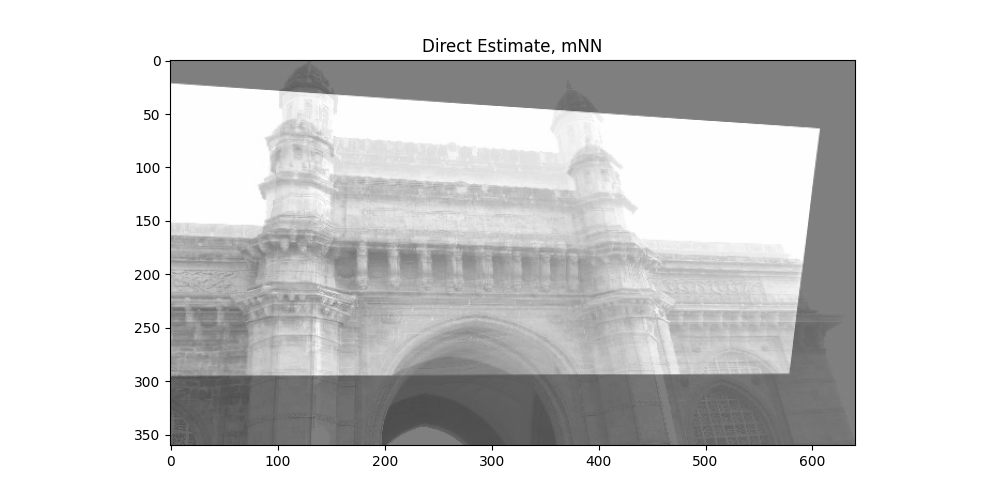

In [14]:
src = kp1[[i for i, _ in mnn_matches]]
dst = kp2[[i for _, i in mnn_matches]]

H = compute_homography(src, dst)

warped = warp(goi2, H, output_shape=goi2.shape)

plt.figure(figsize=(10, 5))
plt.imshow(goi1, alpha=0.5)
plt.imshow(warped, alpha=0.5)
plt.title("Direct Estimate, mNN");

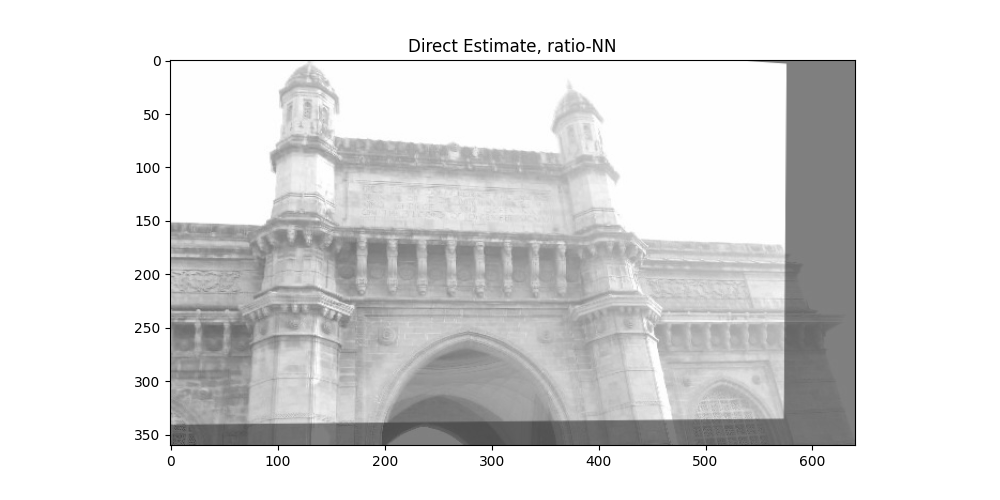

In [16]:
src = kp1[[i for i, _ in rnn_matches]]
dst = kp2[[i for _, i in rnn_matches]]

H = compute_homography(src, dst)

warped = warp(goi2, H, output_shape=goi2.shape)

plt.figure(figsize=(10, 5))
plt.imshow(goi1, alpha=0.5)
plt.imshow(warped, alpha=0.5)
plt.title("Direct Estimate, ratio-NN");

## RANdom SAmple Consensus

In [17]:
def robust_projective(src, dst):
    H, inliers = ransac((src, dst), ProjectiveTransform, min_samples=5, residual_threshold=2, max_trials=100)
    return H, np.sum(inliers)

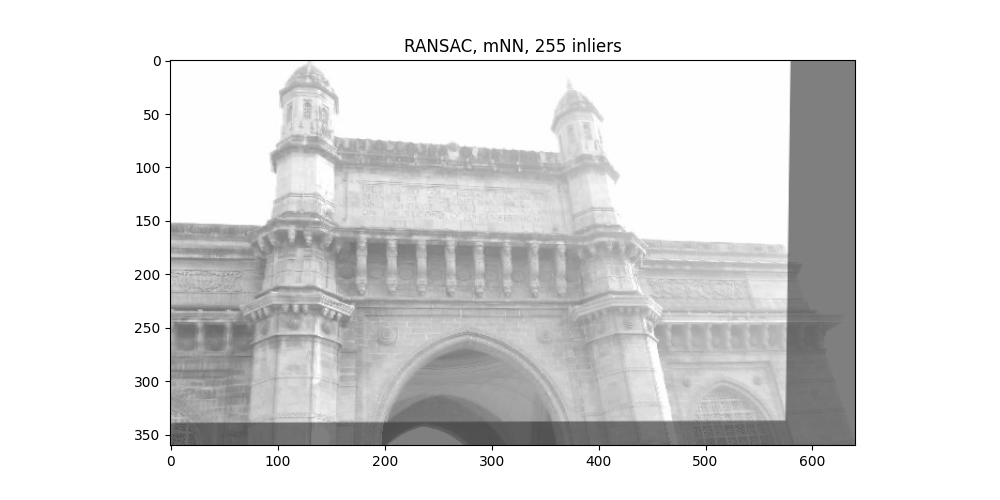

In [18]:
src = kp1[[i for i, _ in mnn_matches]]
dst = kp2[[i for _, i in mnn_matches]]

H_mnn, num_inliers = robust_projective(src, dst)

warped = warp(goi2, H_mnn, output_shape=goi2.shape)

plt.figure(figsize=(10, 5))
plt.imshow(goi1, alpha=0.5)
plt.imshow(warped, alpha=0.5)
plt.title(f"RANSAC, mNN, {num_inliers} inliers");

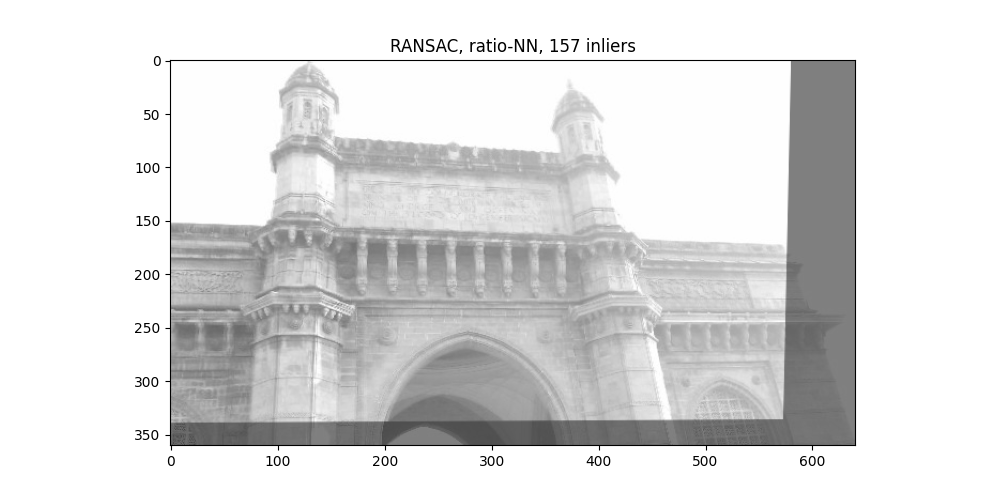

In [19]:
src = kp1[[i for i, _ in rnn_matches]]
dst = kp2[[i for _, i in rnn_matches]]

H_rnn, num_inliers = robust_projective(src, dst)

warped = warp(goi2, H_rnn, output_shape=goi2.shape)

plt.figure(figsize=(10, 5))
plt.imshow(goi1, alpha=0.5)
plt.imshow(warped, alpha=0.5)
plt.title(f"RANSAC, ratio-NN, {num_inliers} inliers");

### Residual Matrix

In [20]:
with np.printoptions(precision=3, suppress=True):
    print(np.around(H_mnn.params @ H_rnn.inverse.params, decimals=3))

[[ 1.01   0.007 -1.62 ]
 [ 0.003  1.011 -1.229]
 [ 0.     0.     0.999]]


# The modern push: SuperPoint

In [21]:
conf = confs["superpoint_inloc"]

In [22]:
dataset = ImageDataset(Path("img/"), conf["preprocessing"], paths=["goi1.jpg", "goi2.jpg"])

device = "cuda" if torch.cuda.is_available() else "cpu"
Model = dynamic_load(extractors, conf["model"]["name"])
model = Model(conf["model"]).eval().to(device)
loader = torch.utils.data.DataLoader(
    dataset, num_workers=1, shuffle=False, pin_memory=True
)

Loaded SuperPoint model


In [23]:
preds = {}
with torch.no_grad():
    for idx, data in enumerate(loader):
        name = dataset.names[idx]
        pred = model({"image": data["image"].to(device, non_blocking=True)})
        pred = {k: v[0].cpu().numpy() for k, v in pred.items()}
        pred["image"] = data["image"][0, 0].cpu().numpy() 
        preds[name] = pred

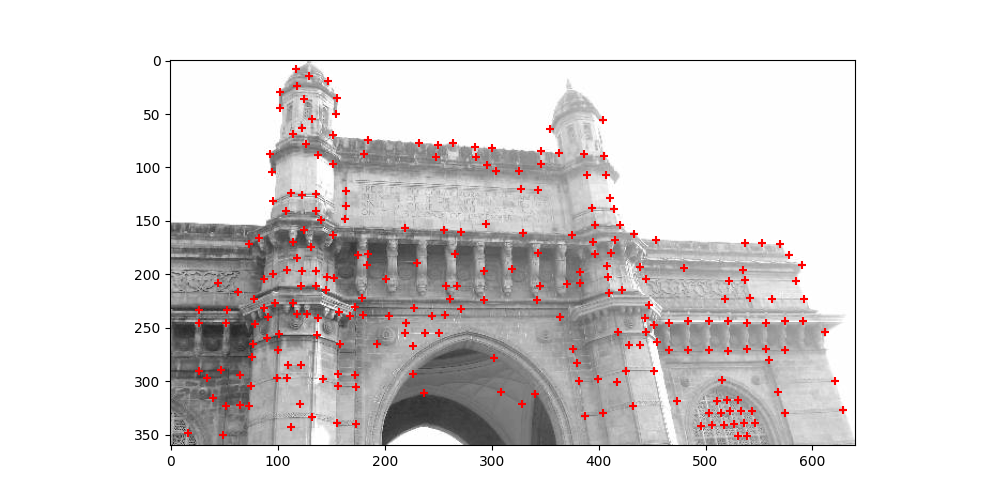

In [24]:
fig = plt.figure(figsize=(10, 5))
pred = preds["goi1.jpg"]
kps    = pred["keypoints"]
scores = pred["scores"]

selected = np.argsort(scores)[-250:] # select top points
kps = kps[selected]

plt.imshow(pred["image"])
plt.scatter(kps[:, 0], kps[:, 1], marker="+", c="r");

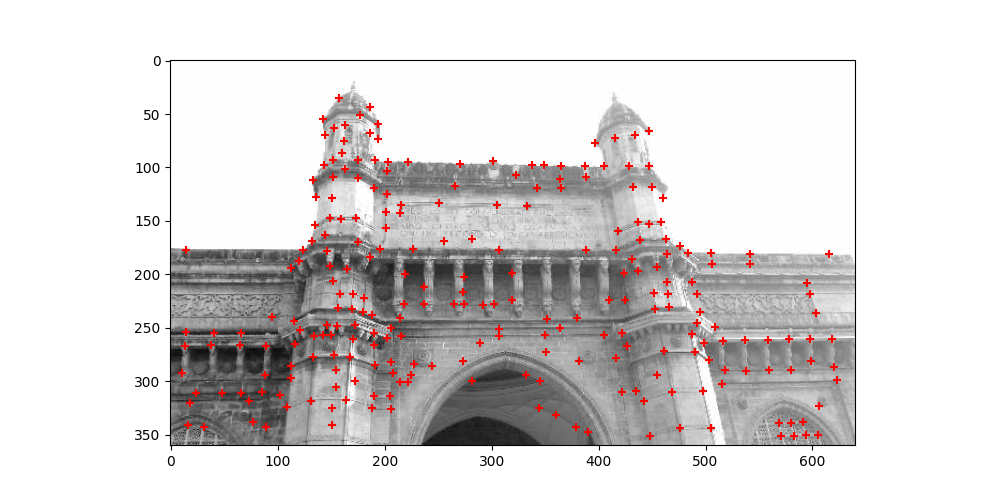

In [25]:
fig = plt.figure(figsize=(10, 5))
pred = preds["goi2.jpg"]
kps    = pred["keypoints"]
scores = pred["scores"]

selected = np.argsort(scores)[-250:] # select top points
kps = kps[selected]

plt.imshow(pred["image"])
plt.scatter(kps[:, 0], kps[:, 1], marker="+", c="r");

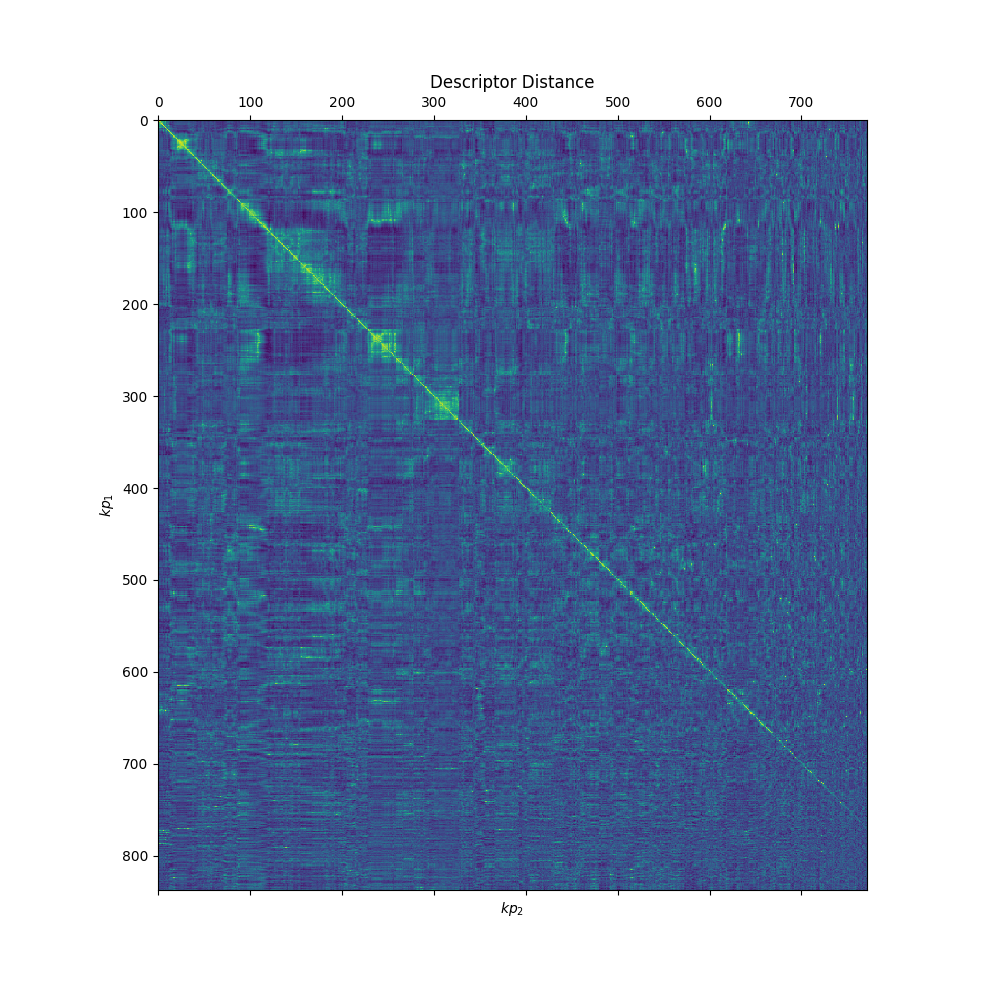

In [26]:
cross_distance = cdist(preds["goi1.jpg"]["descriptors"].T, preds["goi2.jpg"]["descriptors"].T)
fig = plt.figure(figsize=(10, 10))
plt.matshow(-sort_matrix(cross_distance), fignum=0, cmap="viridis");
plt.ylabel("$kp_1$")
plt.xlabel("$kp_2$");
plt.title("Descriptor Distance");

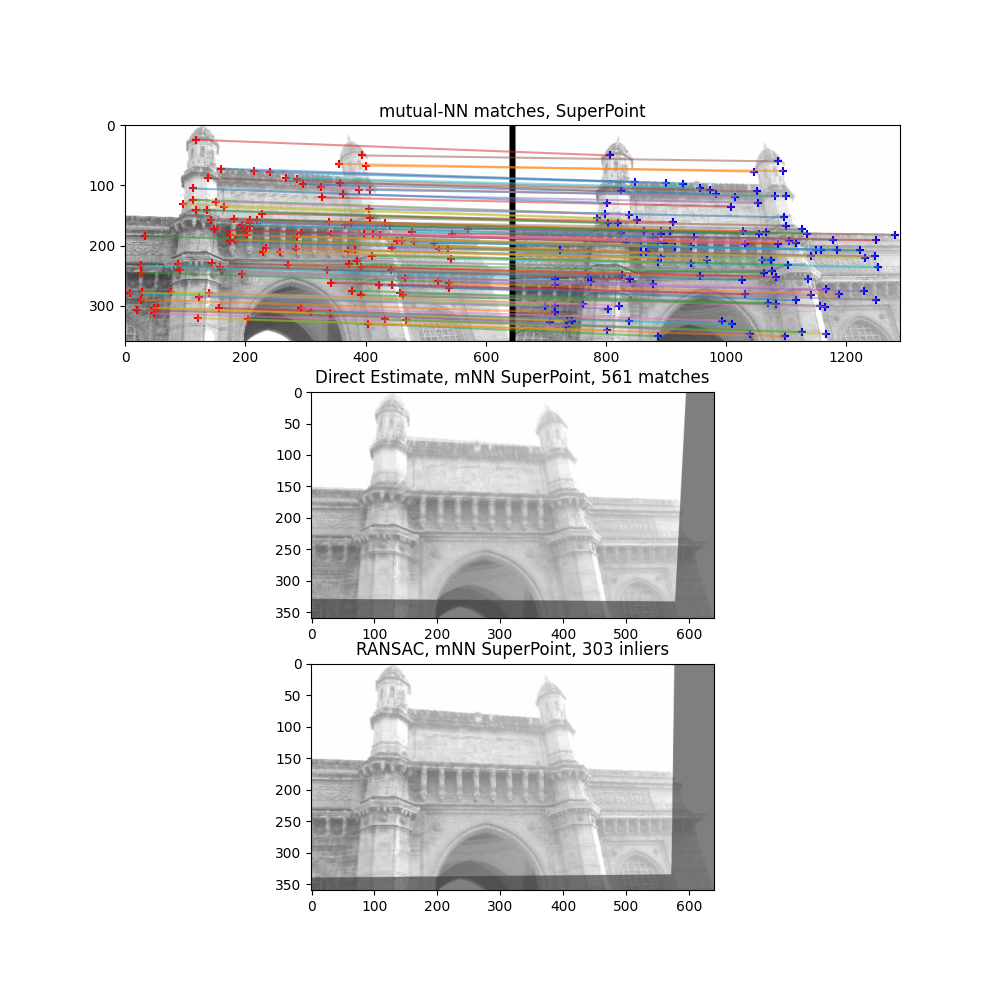

In [28]:
# plot matches
desc1  = preds["goi1.jpg"]["descriptors"].T
desc2  = preds["goi2.jpg"]["descriptors"].T

kp1 = preds["goi1.jpg"]["keypoints"]
kp2 = preds["goi2.jpg"]["keypoints"]

img1 = preds["goi1.jpg"]["image"]
img2 = preds["goi2.jpg"]["image"]

matches = mutual_nn(desc1, desc2)
pairs = matches[::5]
matched_1 = kp1[[i for i, _ in pairs]]
matched_2 = kp2[[i for _, i in pairs]]


fig, ax = plt.subplots(3, 1, figsize=(10,10))

#plot images
padding = 10

ax[0].imshow(np.c_[img1, np.zeros((img1.shape[0], padding)), img2])
dx = img1.shape[1] + padding

# plot matched kps    
ax[0].scatter(matched_1[:, 0], matched_1[:, 1], marker="+", c="r");
ax[0].scatter(dx + matched_2[:, 0], matched_2[:, 1], marker="+", c="b");
    
for (x, y), (w, z) in zip(matched_1, matched_2):
    ax[0].plot((x, dx + w), (y, z), alpha=0.5)

ax[0].set_title("mutual-NN matches, SuperPoint");

# Transform direct
src = kp1[[i for i, _ in matches]]
dst = kp2[[i for _, i in matches]]

H = compute_homography(src, dst)

warped = warp(img2, H, output_shape=img2.shape)
ax[1].imshow(img1, alpha=0.5)
ax[1].imshow(warped, alpha=0.5)
ax[1].set_title(f"Direct Estimate, mNN SuperPoint, {len(src)} matches");

H, num_inliers = robust_projective(src, dst)

warped = warp(img2, H, output_shape=img2.shape)
ax[2].imshow(img1, alpha=0.5)
ax[2].imshow(warped, alpha=0.5)
ax[2].set_title(f"RANSAC, mNN SuperPoint, {num_inliers} inliers");

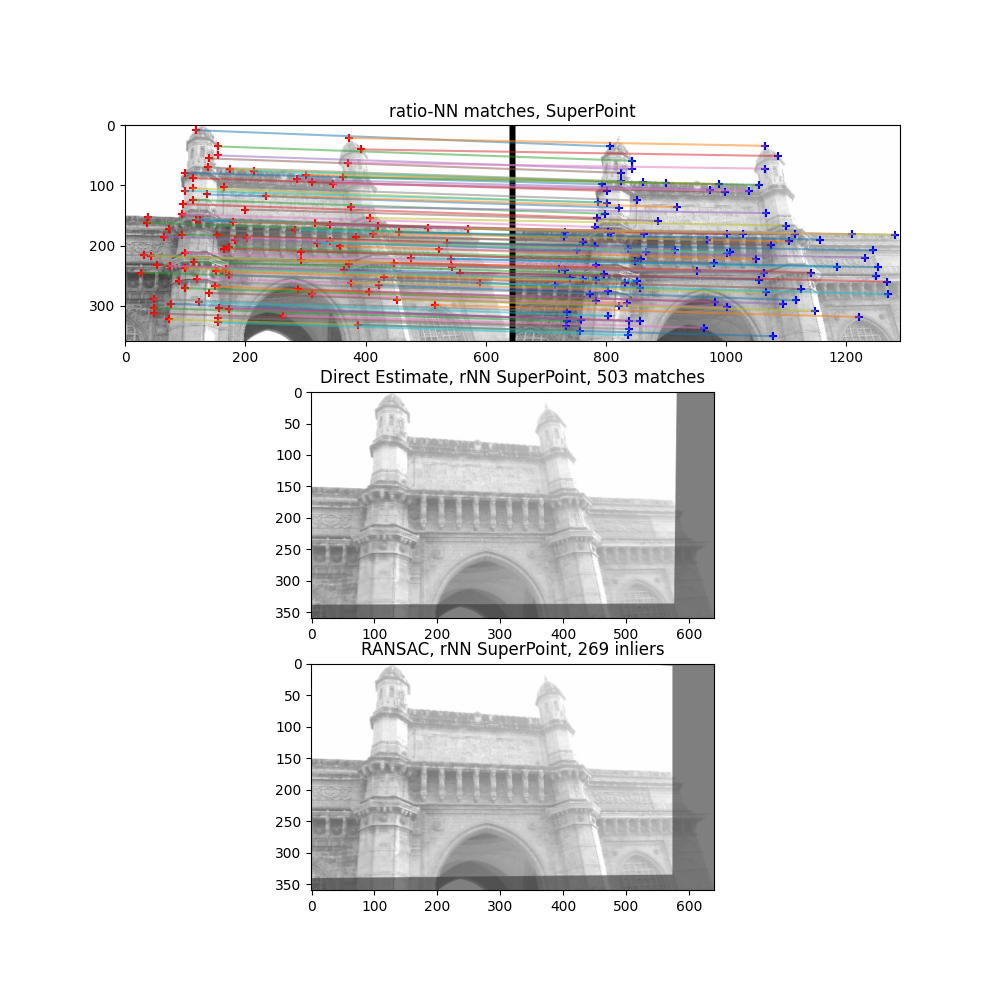

In [29]:
# plot matches
matches = ratio_NN(desc1, desc2)
pairs = matches[::5]
matched_1 = kp1[[i for i, _ in pairs]]
matched_2 = kp2[[i for _, i in pairs]]


fig, ax = plt.subplots(3, 1, figsize=(10,10))

#plot images
padding = 10

ax[0].imshow(np.c_[img1, np.zeros((img1.shape[0], padding)), img2])
dx = img1.shape[1] + padding

# plot matched kps    
ax[0].scatter(matched_1[:, 0], matched_1[:, 1], marker="+", c="r");
ax[0].scatter(dx + matched_2[:, 0], matched_2[:, 1], marker="+", c="b");
    
for (x, y), (w, z) in zip(matched_1, matched_2):
    ax[0].plot((x, dx + w), (y, z), alpha=0.5)

ax[0].set_title("ratio-NN matches, SuperPoint");

# Transform direct
src = kp1[[i for i, _ in matches]]
dst = kp2[[i for _, i in matches]]

H = compute_homography(src, dst)

warped = warp(img2, H, output_shape=img2.shape)
ax[1].imshow(img1, alpha=0.5)
ax[1].imshow(warped, alpha=0.5)
ax[1].set_title(f"Direct Estimate, rNN SuperPoint, {len(src)} matches");

H, num_inliers = robust_projective(src, dst)

warped = warp(img2, H, output_shape=img2.shape)
ax[2].imshow(img1, alpha=0.5)
ax[2].imshow(warped, alpha=0.5)
ax[2].set_title(f"RANSAC, rNN SuperPoint, {num_inliers} inliers");

## And Beyond: SuperGlue matching

In [30]:
from hloc.match_features import confs, dynamic_load, matchers
conf = confs["superpoint+lightglue"]

Model = dynamic_load(matchers, conf["model"]["name"])
model = Model(conf["model"]).eval().to(device)

def to_torch(x):
    return torch.from_numpy(x)[None].to(device) # add batch dimensions

x = {
    "image0": to_torch(img1),
    "image1": to_torch(img2),
    "keypoints0": to_torch(kp1),
    "keypoints1": to_torch(kp2),
    "descriptors0": to_torch(desc1.T),
    "descriptors1": to_torch(desc2.T),
}

with torch.no_grad():
    supergrlue_preds = model(x)

/nfs/home/thadeu.dias/miniforge3/envs/aula_02/lib/python3.10/site-packages/lightglue/lightglue.py:24: FutureWarning: `torch.cuda.amp.custom_fwd(args...)` is deprecated. Please use `torch.amp.custom_fwd(args..., device_type='cuda')` instead.
  @torch.cuda.amp.custom_fwd(cast_inputs=torch.float32)


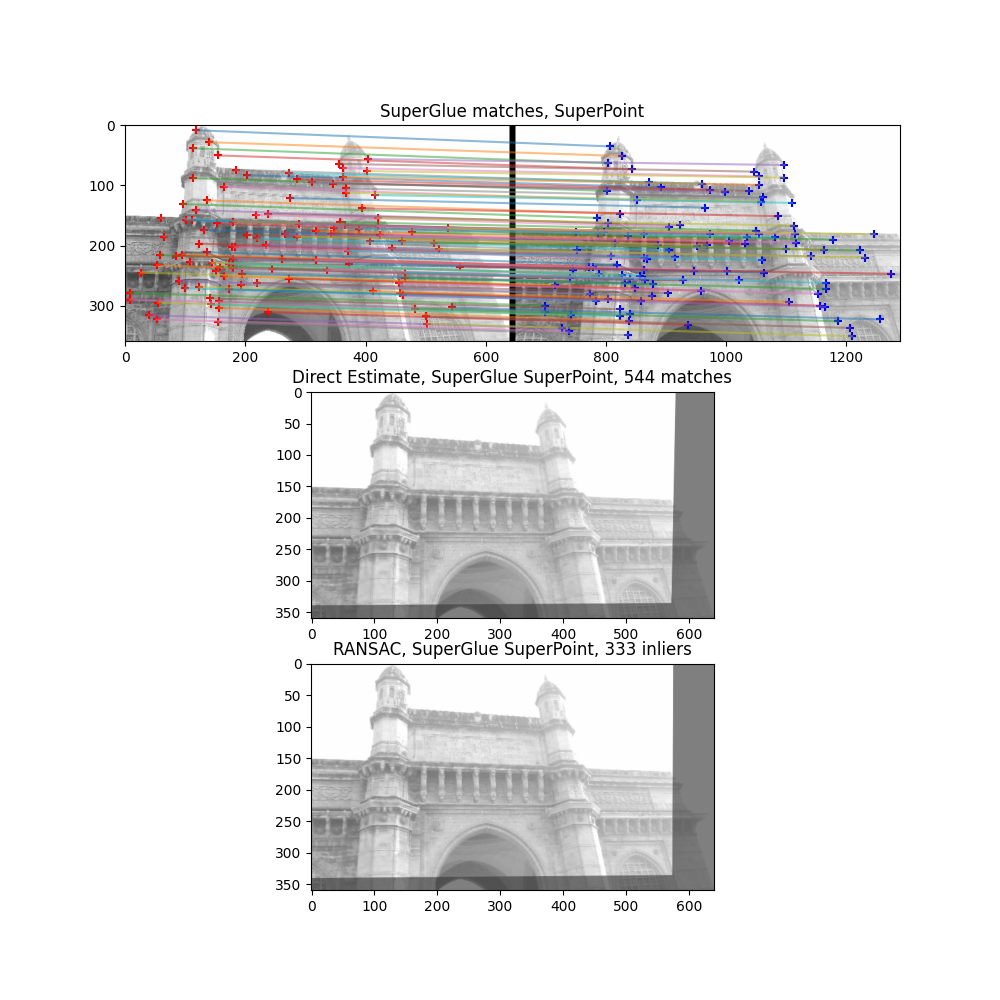

In [31]:
# plot matches
matches = supergrlue_preds["matches"][0].cpu().numpy()
pairs = matches[::5]
matched_1 = kp1[[i for i, _ in pairs]]
matched_2 = kp2[[i for _, i in pairs]]


fig, ax = plt.subplots(3, 1, figsize=(10,10))

#plot images
padding = 10

ax[0].imshow(np.c_[img1, np.zeros((img1.shape[0], padding)), img2])
dx = img1.shape[1] + padding

# plot matched kps    
ax[0].scatter(matched_1[:, 0], matched_1[:, 1], marker="+", c="r");
ax[0].scatter(dx + matched_2[:, 0], matched_2[:, 1], marker="+", c="b");
    
for (x, y), (w, z) in zip(matched_1, matched_2):
    ax[0].plot((x, dx + w), (y, z), alpha=0.5)

ax[0].set_title("SuperGlue matches, SuperPoint");

# Transform direct
src = kp1[[i for i, _ in matches]]
dst = kp2[[i for _, i in matches]]

H = compute_homography(src, dst)

warped = warp(img2, H, output_shape=img2.shape)
ax[1].imshow(img1, alpha=0.5)
ax[1].imshow(warped, alpha=0.5)
ax[1].set_title(f"Direct Estimate, SuperGlue SuperPoint, {len(src)} matches");

H, num_inliers = robust_projective(src, dst)

warped = warp(img2, H, output_shape=img2.shape)
ax[2].imshow(img1, alpha=0.5)
ax[2].imshow(warped, alpha=0.5)
ax[2].set_title(f"RANSAC, SuperGlue SuperPoint, {num_inliers} inliers");